In [1]:
import torch
import torch.nn as nn
from torch.utils.data import Dataset
from torchvision import datasets
from torchvision.transforms import ToTensor
from einops import rearrange
import argparse
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [19]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("xhlulu/140k-real-and-fake-faces")

print("Path to dataset files:", path)


Path to dataset files: /home/yuu/.cache/kagglehub/datasets/xhlulu/140k-real-and-fake-faces/versions/2


Image preparation

In [3]:

def apply_hog(gray_img):

    Gx = np.array([[-1, 0, 1], 
                   [-2, 0, 2], 
                   [-1, 0, 1]])
    
    Gy = np.array([[-1, -2, -1], 
                   [ 0,  0,  0], 
                   [ 1,  2,  1]])
    
    x_filtered = cv2.filter2D(gray_img, -1, kernel=Gx)
    y_filtered = cv2.filter2D(gray_img, -1, kernel=Gy)

    magnitude = np.sqrt(x_filtered**2 + y_filtered**2)
    direction = np.arctan2(y_filtered, x_filtered)

    # norm_direction = cv2.normalize(direction, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX)
    
    return  magnitude, direction

In [4]:
def process_image(input_path, output_path):
    img = cv2.imread(input_path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        print(f"Failed to read image: {input_path}")
        return

    h_mag, h_dir = apply_hog(img)

    if h_mag.shape != h_dir.shape:
        print(f"Filter output size mismatch: {input_path}")
        return

    # Stack into 2-channel array (H, W, 2)
    two_channel_array = np.stack([h_mag, h_dir], axis=-1)

    os.makedirs(os.path.dirname(output_path), exist_ok=True)
    np.save(output_path, two_channel_array)

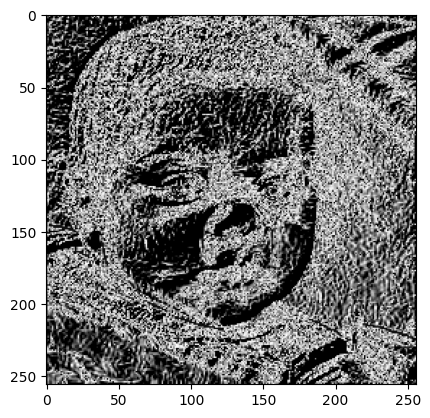

In [10]:
img_path = "../datasets/real-fake_faces/train/real/00000.jpg"
img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
mag, dire = apply_hog(img)
plt.imshow(mag, cmap='gray')
plt.show() 

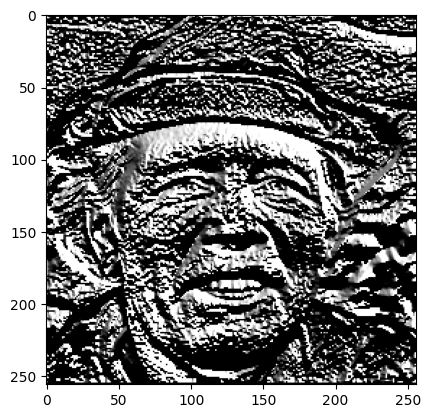

In [13]:
img_path = "../datasets/real-fake_faces/train/fake/0BKH1938PP.jpg"
img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
mag, dire = apply_hog(img)
plt.imshow(dire,cmap='gray')
plt.show() 

In [15]:
def is_image_file(filename):
    return filename.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tif', '.tiff'))

def process_directory(input_dir, output_dir):
    for root, _, files in os.walk(input_dir):
        for file in files:
            if not is_image_file(file):
                continue

            input_path = os.path.join(root, file)
            rel_path = os.path.relpath(input_path, input_dir)
            output_path = os.path.join(output_dir, os.path.splitext(rel_path)[0] + '.npy')

            print(f"Processing: {input_path} → {output_path}")
            process_image(input_path, output_path)


In [18]:
process_directory("../datasets/real-fake_faces", "../datasets/real-fake_faces_processed")

Processing: ../datasets/real-fake_faces/valid/fake/EJ6466XZKI.jpg → ../datasets/real-fake_faces_processed/valid/fake/EJ6466XZKI.npy
Processing: ../datasets/real-fake_faces/valid/fake/V8W2GDVR4W.jpg → ../datasets/real-fake_faces_processed/valid/fake/V8W2GDVR4W.npy
Processing: ../datasets/real-fake_faces/valid/fake/NJ3KWTKR1D.jpg → ../datasets/real-fake_faces_processed/valid/fake/NJ3KWTKR1D.npy
Processing: ../datasets/real-fake_faces/valid/fake/JGG1R9ZTLP.jpg → ../datasets/real-fake_faces_processed/valid/fake/JGG1R9ZTLP.npy
Processing: ../datasets/real-fake_faces/valid/fake/4LIUSAF3N4.jpg → ../datasets/real-fake_faces_processed/valid/fake/4LIUSAF3N4.npy
Processing: ../datasets/real-fake_faces/valid/fake/Q9403CSCUW.jpg → ../datasets/real-fake_faces_processed/valid/fake/Q9403CSCUW.npy
Processing: ../datasets/real-fake_faces/valid/fake/VDNYPVQUZA.jpg → ../datasets/real-fake_faces_processed/valid/fake/VDNYPVQUZA.npy
Processing: ../datasets/real-fake_faces/valid/fake/KI23XEXIIC.jpg → ../datas

Create Dataloader

In [7]:
import os
import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader

class NPYDataset(Dataset):
    def __init__(self, root_dir):
        self.samples = []
        self.label_map = {'real': 0, 'fake': 1}

        for label_name in ['real', 'fake']:
            class_dir = os.path.join(root_dir, label_name)
            for fname in os.listdir(class_dir):
                if fname.endswith('.npy'):
                    fpath = os.path.join(class_dir, fname)
                    self.samples.append((fpath, self.label_map[label_name]))

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        fpath, label = self.samples[idx]
        data = np.load(fpath)
        data = np.transpose(data, (2, 0, 1))
        data_tensor = torch.from_numpy(data).float()  # convert to float tensor
        return data_tensor, label

In [6]:
def get_dataloaders(data_root, batch_size=32, num_workers=2):
    train_dataset = NPYDataset(os.path.join(data_root, 'train'))
    valid_dataset = NPYDataset(os.path.join(data_root, 'valid'))
    test_dataset  = NPYDataset(os.path.join(data_root, 'test'))

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers)
    valid_loader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)
    test_loader  = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)

    return train_loader, valid_loader, test_loader


In [10]:
data_root = '../datasets/real-fake_faces_processed'
train_loader, valid_loader, test_loader = get_dataloaders(data_root)

# Example iteration
for batch_data, batch_labels in train_loader:
    print(batch_data.shape, batch_labels.shape)
    break


torch.Size([32, 2, 256, 256]) torch.Size([32])


Vision Transformer

In [14]:
class PatchEmbedding(nn.Module):
    def __init__(self, in_channels, patch_size, emb_dim, img_size):
        super().__init__()
        self.num_patches = (img_size // patch_size) ** 2
        self.proj = nn.Conv2d(in_channels, emb_dim, kernel_size=patch_size, stride=patch_size)

    def forward(self, x):
        x = self.proj(x)  # [B, emb_dim, H', W']
        x = rearrange(x, 'b c h w -> b (h w) c')  # [B, num_patches, emb_dim]
        return x

In [15]:

class TransformerEncoder(nn.Module):
    def __init__(self, emb_dim, heads, mlp_dim, dropout):
        super().__init__()
        self.norm1 = nn.LayerNorm(emb_dim)
        self.attn = nn.MultiheadAttention(emb_dim, heads, dropout=dropout, batch_first=True)
        self.norm2 = nn.LayerNorm(emb_dim)
        self.mlp = nn.Sequential(
            nn.Linear(emb_dim, mlp_dim),
            nn.GELU(),
            nn.Dropout(dropout),
            nn.Linear(mlp_dim, emb_dim),
            nn.Dropout(dropout)
        )

    def forward(self, x):
        x = x + self.attn(self.norm1(x), self.norm1(x), self.norm1(x))[0]
        x = x + self.mlp(self.norm2(x))
        return x

In [16]:

class ViT2Channel(nn.Module):
    def __init__(self, img_size=256, patch_size=16, in_channels=2, num_classes=2,
                 emb_dim=256, depth=8, heads=8, mlp_dim=512, dropout=0.1):
        super().__init__()
        self.patch_embed = PatchEmbedding(in_channels, patch_size, emb_dim, img_size)
        self.num_patches = (img_size // patch_size) ** 2

        self.cls_token = nn.Parameter(torch.randn(1, 1, emb_dim))
        self.pos_embed = nn.Parameter(torch.randn(1, self.num_patches + 1, emb_dim))
        self.dropout = nn.Dropout(dropout)

        self.transformer = nn.Sequential(*[
            TransformerEncoder(emb_dim, heads, mlp_dim, dropout) for _ in range(depth)
        ])
        self.mlp_head = nn.Sequential(
            nn.LayerNorm(emb_dim),
            nn.Linear(emb_dim, num_classes)
        )

    def forward(self, x):
        B = x.shape[0]
        x = self.patch_embed(x)  # [B, num_patches, emb_dim]
        cls_tokens = self.cls_token.expand(B, -1, -1)  # [B, 1, emb_dim]
        x = torch.cat((cls_tokens, x), dim=1)  # [B, num_patches + 1, emb_dim]
        x = x + self.pos_embed
        x = self.dropout(x)

        x = self.transformer(x)
        cls_output = x[:, 0]  # CLS token
        return self.mlp_head(cls_output)

In [17]:
#  Test run
if __name__ == "__main__":
    model = ViT2Channel(img_size=256, patch_size=16, in_channels=2)
    dummy_input = torch.randn(4, 2, 256, 256)  # batch of 4 images
    output = model(dummy_input)
    print("Output shape:", output.shape)  # Expected: [4, 2]

Output shape: torch.Size([4, 2])


In [18]:
import torch
import torch.optim as optim

def train_model(model, train_loader, valid_loader, num_epochs=10, lr=1e-3, device='cpu'):
    model.to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=lr)
    
    for epoch in range(num_epochs):
        model.train()
        total_loss = 0
        correct = 0

        for data, labels in train_loader:
            data, labels = data.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(data)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            total_loss += loss.item()
            _, preds = torch.max(outputs, 1)
            correct += (preds == labels).sum().item()

        acc = correct / len(train_loader.dataset)
        print(f"Epoch {epoch+1}/{num_epochs} - Train Loss: {total_loss:.4f}, Accuracy: {acc:.4f}")

        # Validation
        model.eval()
        val_correct = 0
        with torch.no_grad():
            for val_data, val_labels in valid_loader:
                val_data, val_labels = val_data.to(device), val_labels.to(device)
                val_outputs = model(val_data)
                _, val_preds = torch.max(val_outputs, 1)
                val_correct += (val_preds == val_labels).sum().item()
        val_acc = val_correct / len(valid_loader.dataset)
        print(f"Validation Accuracy: {val_acc:.4f}")

    torch.save(model.state_dict(), f'../checkpoints/ViT/ViT_{num_epochs}.pt')

In [19]:
train_loader, valid_loader, test_loader = get_dataloaders(data_root, batch_size=128)

# Automatically detect input dimension
# sample, _ = next(iter(train_loader))
# input_dim = sample[0].numel()  # total number of features
device='cuda' if torch.cuda.is_available() else 'cpu'
print(device)
model = ViT2Channel()
train_model(model, train_loader, valid_loader, num_epochs=100, device=device)


cuda


RuntimeError: CUDA error: device-side assert triggered
CUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.


In [25]:
torch.save(model.state_dict(), '../checkpoints/ViT/ViT_77.pt')

In [20]:
print(f"Allocated memory: {torch.cuda.memory_allocated() / 1024**2:.2f} MB")
print(f"Cached memory: {torch.cuda.memory_reserved() / 1024**2:.2f} MB")
torch.cuda.empty_cache()
print(f"Allocated memory: {torch.cuda.memory_allocated() / 1024**2:.2f} MB")
print(f"Cached memory: {torch.cuda.memory_reserved() / 1024**2:.2f} MB")

Allocated memory: 3353.64 MB
Cached memory: 3770.00 MB


RuntimeError: CUDA error: device-side assert triggered
CUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.


In [21]:
def load_checkpoint(checkpoint, model, optimizer):
    print("=> Loading checkpoint")
    model.load_state_dict(checkpoint['state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer'])

In [22]:
model = ViT2Channel()
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-3)
print(f"Allocated memory: {torch.cuda.memory_allocated() / 1024**2:.2f} MB")
print(f"Cached memory: {torch.cuda.memory_reserved() / 1024**2:.2f} MB")
checkpoint = torch.load("../checkpoints/ViT/ViT_10.pt")
load_checkpoint(checkpoint, model, optimizer)
print(f"Allocated memory: {torch.cuda.memory_allocated() / 1024**2:.2f} MB")
print(f"Cached memory: {torch.cuda.memory_reserved() / 1024**2:.2f} MB")

Allocated memory: 3353.64 MB
Cached memory: 3770.00 MB


RuntimeError: CUDA error: device-side assert triggered
CUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.


Try with CNN

In [27]:
import torch.nn as nn
import torch.nn.functional as F
class CNNClassifier(nn.Module):
    def __init__(self):
        super(CNNClassifier, self).__init__()
        self.conv1 = nn.Conv2d(2, 32, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.pool = nn.MaxPool2d(2, 2)

        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.conv4 = nn.Conv2d(128, 128, kernel_size=3, padding=1)

        self.feedforward = nn.Sequential(    
            nn.Linear(128 * 16 * 16, 256),
            nn.LeakyReLU(0.2), 
            nn.Linear(256, 128),
            nn.LeakyReLU(0.2),
            nn.Linear(128, 64),
            nn.LeakyReLU(0.2),
            nn.Linear(64, 2),
        )
    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))  # [B, 32, 128, 128]
        x = self.pool(F.relu(self.conv2(x)))  # [B, 64, 64, 64]
        x = self.pool(F.relu(self.conv3(x)))  # [B, 128, 32, 32]
        x = self.pool(F.relu(self.conv4(x)))  # [B, 128, 16, 16]
        x = x.view(x.size(0), -1)
        x = self.feedforward(x)
        return x

In [28]:
train_loader, valid_loader, test_loader = get_dataloaders(data_root, batch_size=128)

# Automatically detect input dimension
# sample, _ = next(iter(train_loader))
# input_dim = sample[0].numel()  # total number of features
device='cuda' if torch.cuda.is_available() else 'cpu'
print(device)
model = CNNClassifier()
train_model(model, train_loader, valid_loader, num_epochs=100, device=device)

cuda


RuntimeError: CUDA error: device-side assert triggered
CUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.


In [ ]:


def apply_hog(gray_img):

    Gx = np.array([[-1, 0, 1], 
                   [-2, 0, 2], 
                   [-1, 0, 1]])
    
    Gy = np.array([[-1, -2, -1], 
                   [ 0,  0,  0], 
                   [ 1,  2,  1]])
    
    x_filtered = cv2.filter2D(gray_img, -1, kernel=Gx)
    y_filtered = cv2.filter2D(gray_img, -1, kernel=Gy)

    magnitude = np.sqrt(x_filtered**2 + y_filtered**2)
    direction = np.arctan2(y_filtered / x_filtered)
    
    return  magnitude.astype(np.unit8), normalize_to_uint8(direction)


def apply_second_filter(img_gray):
    filtered = cv2.Laplacian(img_gray, cv2.CV_64F)
    return normalize_to_uint8(filtered)

def normalize_to_uint8(img):
    norm = cv2.normalize(img, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX)
    return norm.astype(np.uint8)

def is_image_file(filename):
    return filename.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tif', '.tiff'))

def process_image(input_path, output_path):
    img = cv2.imread(input_path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        print(f"Failed to read image: {input_path}")
        return

    filter1 = apply_first_filter(img)
    filter2 = apply_second_filter(img)

    if filter1.shape != filter2.shape:
        print(f"Filter output size mismatch: {input_path}")
        return

    # Stack into 2-channel array (H, W, 2)
    two_channel_array = np.stack([filter1, filter2], axis=-1)

    os.makedirs(os.path.dirname(output_path), exist_ok=True)
    np.save(output_path, two_channel_array)

def process_directory(input_dir, output_dir):
    for root, _, files in os.walk(input_dir):
        for file in files:
            if not is_image_file(file):
                continue

            input_path = os.path.join(root, file)
            rel_path = os.path.relpath(input_path, input_dir)
            output_path = os.path.join(output_dir, os.path.splitext(rel_path)[0] + '.npy')

            print(f"Processing: {input_path} → {output_path}")
            process_image(input_path, output_path)

if __name__ == "__main__":
    import argparse
    parser = argparse.ArgumentParser(description="Preprocess images with two filters and save as 2-channel .npy arrays.")
    parser.add_argument("input_dir", help="Path to input image directory")
    parser.add_argument("output_dir", help="Path to output directory")
    args = parser.parse_args()

    if not os.path.isdir(args.input_dir):
        print("Invalid input directory.")
        exit(1)

    process_directory(args.input_dir, args.output_dir)
    print("All images processed and saved as .npy.")
